# Starting Dataset - Analysis of Features Extracted

In [69]:
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import numpy as np
import json
import boto3
from loading_s3_data import *
import seaborn as sns
from eye_gazing_analysis import *

In [70]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['agg.path.chunksize'] = 0
mpl.rcParams.update( mpl.rc_params() )
plt.rcParams.update({'font.size': 11})
#plt.rcParams.update({'text.usetex': True})
plt.rcParams.update({'text.latex.preamble': 'bold'})
plt.rc('font', family='serif')

## I. We load our data.

In [71]:
df = pd.read_csv('starting_dataset_rekognition_extracted_tested.csv')
df

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,Gender,GenderConf,Size,downsampling_count,fps,number_of_frames,total_confidence,number_of_frames_with_face,confidences,eye_directions
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,Female,99.6,0.236465,858,14.895833,572,94.004836,571,"[99.932861328125, 99.00003051757812, 99.040435...","[[-2.957106828689575, -6.7206130027771], [-2.6..."
1,1,sagacoatings%40gmail.com/1649443677729/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.7,29.8,600.0,800.0,...,Female,99.7,0.120666,859,14.887348,573,74.356875,573,"[99.92636108398438, 99.82949829101562, 99.0796...","[[-8.12035083770752, -10.779633522033691], [-7..."
2,2,_REVIEWED/remote_participants/claudiarathwick@...,claudiarathwick@gmail.com__Jacob,1,7.0,Male,89.1,25.0,360.0,480.0,...,Male,94.6,0.028115,1000,11.223345,1000,75.659223,429,"[99.99989318847656, 100.0, 99.99979400634766, ...","[[1.7810202836990356, 2.2886269092559814], [-0..."
3,3,sherylflynn5@gmail.com/1649453242/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,92.6,25.0,360.0,480.0,...,Female,90.4,0.151472,1000,10.799136,1000,57.818291,749,"[None, None, None, None, None, None, None, 99....","[[None, None], [None, None], [None, None], [No..."
4,4,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,94.6,25.0,360.0,480.0,...,Female,93.7,0.034413,1000,10.570825,1000,58.162087,695,"[None, 1.0850621454779076e-22, 5.8727335487078...","[[None, None], [-8.45094108581543, -2.13595128..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,623,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.6,30.0,768.0,1024.0,...,Female,87.8,0.089018,575,9.982639,575,81.052501,575,"[100.0, 99.99999237060547, 99.0078353881836, 0...","[[-2.703453779220581, -9.00334358215332], [-1...."
624,624,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,29.9,768.0,1024.0,...,Female,89.1,0.180934,861,14.973913,574,83.729452,574,"[99.99960327148438, 99.99935913085938, 99.9982...","[[4.584129810333252, -9.231253623962402], [4.3..."
625,625,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,30.0,768.0,1024.0,...,Female,96.5,0.197602,574,9.982609,574,91.151130,574,"[99.99803161621094, 99.99978637695312, 99.9999...","[[10.937582969665527, -12.633040428161621], [1..."
626,626,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.4,29.9,768.0,1024.0,...,Female,93.7,0.163169,860,14.982578,573,78.289193,566,"[99.00015258789062, 99.00237274169922, 99.8658...","[[9.93967342376709, 4.3936381340026855], [10.5..."


In [72]:
#We apply eval to the column to convert the string to a list
df['eye_directions'] = df['eye_directions'].apply(eval) 
df['confidences'] = df['confidences'].apply(eval)

We run some sanity checks on the data set. We expect the following :
- the number of frames is the length of the list of confidences
- the length of the list of eye_directions is the same as the length of the list of confidences
- the number of frames with face is the length of the list of confidences without None values
- the total confidence is the sum of the confidences divided by the number of frames with face

In [73]:
#We do some sanity checks on the dataset
#We check that the number of frames is the length of the list of confidences
for i in range(len(df)):
    assert len(df.iloc[i]['confidences']) == df.iloc[i]['number_of_frames']

#We check that the length of the list of eye_directions is the same as the length of the list of confidences
for i in range(len(df)):
    assert len(df.iloc[i]['eye_directions']) == len(df.iloc[i]['confidences'])

#We check that the number of frames with face is the length of the list of confidences without None values
for i in range(len(df)):
    assert df.iloc[i]['number_of_frames_with_face'] == len([x for x in df.iloc[i]['confidences'] if x is not None])

#We check that the total confidence is the sum of the confidences divided by the number of frames with face
for i in range(len(df)):
    #We round the total confidence to 2 decimals
    total_confidence = round(df.iloc[i]['total_confidence'],2)
    #We round the average confidence to 2 decimals
    average_confidence = round(sum([x for x in df.iloc[i]['confidences'] if x is not None])/df.iloc[i]['number_of_frames_with_face'],2)
    assert total_confidence == average_confidence

#We check that the max of total confidence is <=100 and the min is <=0
max_total_confidence = max(df['total_confidence'])
min_total_confidence = min(df['total_confidence'])
assert max_total_confidence <= 100
assert min_total_confidence >= 0

#We check that for each confidence of None there is a corresponding eye_direction of [None, None]
for i in range(len(df)):
    for j in range(len(df.iloc[i]['confidences'])):
        if df.iloc[i]['confidences'][j] is None:
            assert df.iloc[i]['eye_directions'][j] == [None, None]

Text(0.5, 0, 'Proportion of frames with face')

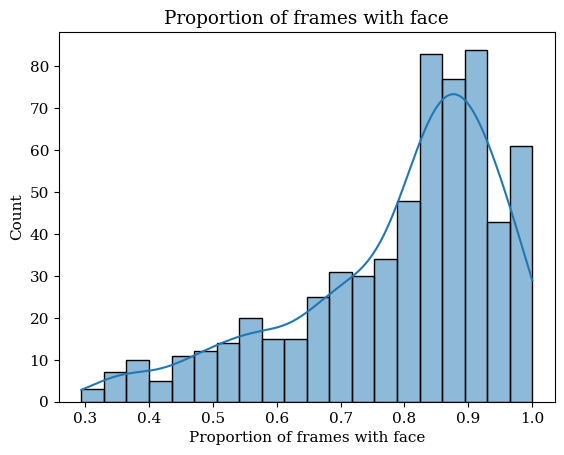

In [74]:
#We plot the proportion of frames with face out of the total number of frames
sns.histplot(df['number_of_frames_with_face']/df['number_of_frames'], bins=20, kde=True)
plt.title('Proportion of frames with face')
plt.xlabel('Proportion of frames with face')

Text(0.5, 1.0, 'Total confidence of eye gazing extraction')

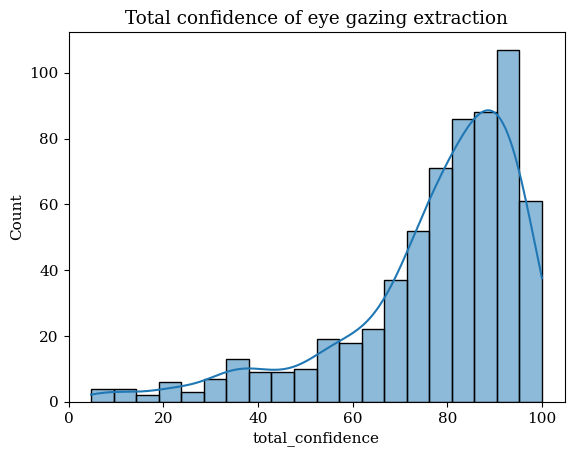

In [75]:
#We plot the total confidence
sns.histplot(df['total_confidence'], bins=20, kde=True)
plt.title('Total confidence of eye gazing extraction')

## II. Preprocessing

We do some preprocessing : 
- if the confidence of the eye gaze extracted is less than 70, we set it to None because it is too low to be considered.
- we truncate the None at the beginning or at the end of the videos.

In [76]:
df_preprocessed = df.copy()

In [77]:
#if the confidence is less than 70, we set it to None (we consider that the confidence is too low to be considered)
def preprocess_confidence(row):
    confidences = row['confidences']
    number_of_frames_with_face = row['number_of_frames_with_face']
    eye_directions = row['eye_directions']
    new_confidences = []
    new_eye_directions = [] 
    for confidence, eye_direction  in zip(confidences, eye_directions):
        if confidence is None:
            new_confidences.append(None)
            new_eye_directions.append(eye_direction)
        elif confidence < 70:
            new_confidences.append(None)
            number_of_frames_with_face -= 1
            #We set the eye_direction to [None, None]
            eye_direction = [None, None]
            new_eye_directions.append(eye_direction)
        else:
            new_confidences.append(confidence)
            new_eye_directions.append(eye_direction)
        
    row['confidences'] = new_confidences
    row['number_of_frames_with_face'] = number_of_frames_with_face
    row['eye_directions'] = new_eye_directions
    return row

In [78]:
df_preprocessed = df_preprocessed.apply(preprocess_confidence, axis=1)

We check that no confidence in confidence is below 70 and each None in confidences corresponds to [None, None] in eye_directions. 

In [79]:
#We check that no confidence in confidences is less than 70 (for confidence != None)
for i in range(len(df_preprocessed)):
    for confidence in df_preprocessed.iloc[i]['confidences']:
        if confidence is not None:
            assert confidence >= 70

In [80]:
#We check that for each confidence of None there is a corresponding eye_direction of [None, None]
for i in range(len(df_preprocessed)):
    for j in range(len(df_preprocessed.iloc[i]['confidences'])):
        if df_preprocessed.iloc[i]['confidences'][j] is None:
            assert df_preprocessed.iloc[i]['eye_directions'][j] == [None, None]

In [81]:
def truncate(row):
    """This function truncates a video that has no face at the beginning or at the end.
    It truncates the eye_directions and confidences lists and updates the number_of_frames."""
    #We get the index of the first non None value
    first_non_none_index = row['confidences'].index(next(x for x in row['confidences'] if x is not None))
    #We get the index of the last non None value
    last_non_none_index = len(row['confidences']) - row['confidences'][::-1].index(next(x for x in row['confidences'][::-1] if x is not None)) - 1
    #We truncate the eye_directions list
    row['eye_directions'] = row['eye_directions'][first_non_none_index:last_non_none_index+1]
    #We truncate the confidences list
    row['confidences'] = row['confidences'][first_non_none_index:last_non_none_index+1]
    #We update the number of frames
    row['number_of_frames'] = len(row['eye_directions'])
    return row

In [82]:
#We apply the truncate function to the dataframe
df_preprocessed = df_preprocessed.apply(truncate, axis=1)

In [83]:
#We count the number of videos that we have truncated (ie. we compare the number of frames before and after truncating)
number_of_truncated_videos = len(df_preprocessed[df_preprocessed['number_of_frames'] != df['number_of_frames']])
print('Number of truncated videos: ', number_of_truncated_videos)
#We look at the mean number of frames truncated
mean_number_of_frames_truncated = np.mean(df_preprocessed[df_preprocessed['number_of_frames'] != df['number_of_frames']]['number_of_frames'] - df[df['number_of_frames'] != df_preprocessed['number_of_frames']]['number_of_frames'])
print('Mean number of frames truncated: ', mean_number_of_frames_truncated)

Number of truncated videos:  426
Mean number of frames truncated:  -34.39671361502347


We recompute the total confidence. 

In [84]:
#We compute the total confidence using the confidences that are not None
def compute_total_confidence(row):
    confidences = row['confidences']
    number_of_frames_with_face = row['number_of_frames_with_face']
    total_confidence = sum([x for x in confidences if x is not None])
    row['total_confidence'] = total_confidence/number_of_frames_with_face
    return row

df_preprocessed = df_preprocessed.apply(compute_total_confidence, axis=1)

## III. Some statistics about the extraction

Text(0.5, 1.0, 'Number of frames with face')

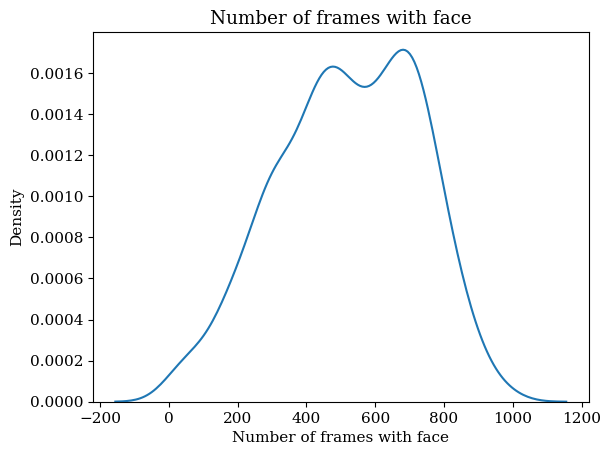

In [85]:
#We look at a kde plot of the number of frames with face
sns.kdeplot(df_preprocessed['number_of_frames_with_face'])
plt.xlabel('Number of frames with face')
plt.title('Number of frames with face')

Text(0.5, 1.0, 'Proportion of frames with face')

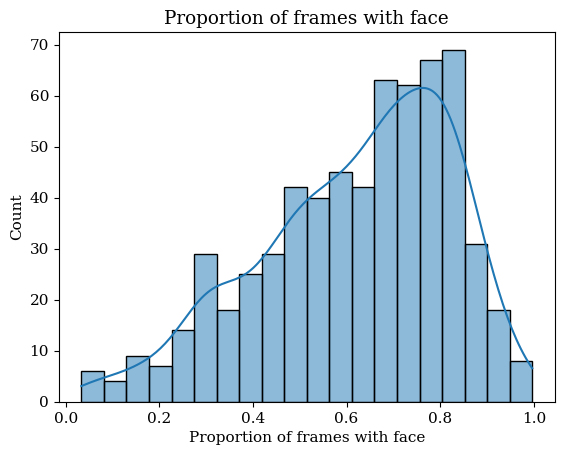

In [86]:
#We look at the proportion of frames with face in a video
sns.histplot(df_preprocessed['number_of_frames_with_face']/df_preprocessed['number_of_frames'], bins=20, kde=True)
plt.xlabel('Proportion of frames with face')
plt.title('Proportion of frames with face')

Text(0.5, 1.0, 'Total confidence of eye gazing extraction after preprocessing')

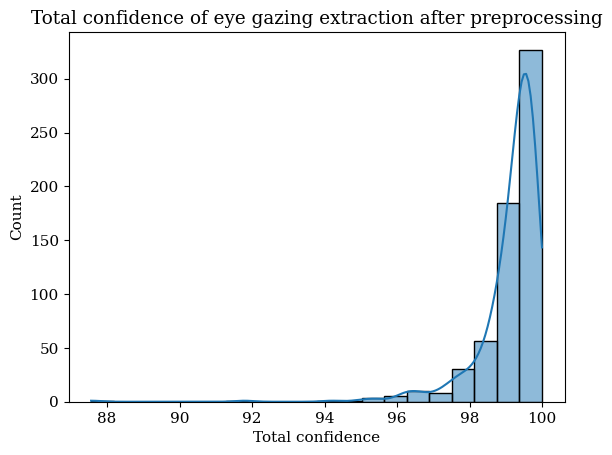

In [87]:
#We look at the confidence of the eye gaze for frames with face
sns.histplot(df_preprocessed['total_confidence'], bins=20, kde=True)
plt.xlabel('Total confidence')
plt.title('Total confidence of eye gazing extraction after preprocessing')

## IV. We preprocess our extractions.

In [88]:
#We filter the dataset to curate a high quality dataset
df_filtered = df_preprocessed.copy()

- We want to ignore the videos with more than 0.7 percent of the video without face.

In [89]:
#We ignore the videos with less than 20 seconds of eye direction data
df_filtered = df_filtered[df_filtered['number_of_frames_with_face'] >= 20*10]
df_filtered

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,Gender,GenderConf,Size,downsampling_count,fps,number_of_frames,total_confidence,number_of_frames_with_face,confidences,eye_directions
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,Female,99.6,0.236465,858,14.895833,572,99.438819,534,"[99.932861328125, 99.00003051757812, 99.040435...","[[-2.957106828689575, -6.7206130027771], [-2.6..."
1,1,sagacoatings%40gmail.com/1649443677729/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.7,29.8,600.0,800.0,...,Female,99.7,0.120666,859,14.887348,570,97.730921,408,"[99.92636108398438, 99.82949829101562, 99.0796...","[[-8.12035083770752, -10.779633522033691], [-7..."
2,2,_REVIEWED/remote_participants/claudiarathwick@...,claudiarathwick@gmail.com__Jacob,1,7.0,Male,89.1,25.0,360.0,480.0,...,Male,94.6,0.028115,1000,11.223345,1000,99.377062,317,"[99.99989318847656, 100.0, 99.99979400634766, ...","[[1.7810202836990356, 2.2886269092559814], [-0..."
3,3,sherylflynn5@gmail.com/1649453242/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,92.6,25.0,360.0,480.0,...,Female,90.4,0.151472,1000,10.799136,992,98.990505,419,"[99.99876403808594, None, None, None, None, No...","[[-23.315263748168945, -3.1237051486968994], [..."
4,4,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,94.6,25.0,360.0,480.0,...,Female,93.7,0.034413,1000,10.570825,975,99.006380,391,"[99.92616271972656, None, None, None, None, No...","[[13.27838134765625, -2.3714399337768555], [No..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,623,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.6,30.0,768.0,1024.0,...,Female,87.8,0.089018,575,9.982639,575,98.835605,446,"[100.0, 99.99999237060547, 99.0078353881836, N...","[[-2.703453779220581, -9.00334358215332], [-1...."
624,624,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,29.9,768.0,1024.0,...,Female,89.1,0.180934,861,14.973913,574,99.319437,478,"[99.99960327148438, 99.99935913085938, 99.9982...","[[4.584129810333252, -9.231253623962402], [4.3..."
625,625,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,30.0,768.0,1024.0,...,Female,96.5,0.197602,574,9.982609,574,99.573393,521,"[99.99803161621094, 99.99978637695312, 99.9999...","[[10.937582969665527, -12.633040428161621], [1..."
626,626,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.4,29.9,768.0,1024.0,...,Female,93.7,0.163169,860,14.982578,573,98.919363,426,"[99.00015258789062, 99.00237274169922, 99.8658...","[[9.93967342376709, 4.3936381340026855], [10.5..."


In [90]:
#We check the distribution of the labels
df_filtered['ASD'].value_counts()

1    443
0    139
Name: ASD, dtype: int64

In [91]:
df_filtered['total_confidence'].describe()

count    582.000000
mean      99.262721
std        0.622939
min       96.037790
25%       99.052080
50%       99.433888
75%       99.671982
max       99.998486
Name: total_confidence, dtype: float64

In [92]:
def get_yaw_pitch_statistics(eye_directions_features):
    """This function returns the statistics of the yaw and pitch values for a given video. 
    The statistics are the mean, standard deviation, minimum and maximum values. """

    # We get the yaw and pitch values for the video, we ignore the None
    yaw = [x[0] for x in eye_directions_features if x[0] != None]
    pitch = [x[1] for x in eye_directions_features if x[1] != None]

    # We get the statistics for yaw
    yaw_mean = np.mean(yaw)
    yaw_std = np.std(yaw)
    yaw_min = np.min(yaw)
    yaw_max = np.max(yaw)

    # We get the statistics for pitch
    pitch_mean = np.mean(pitch)
    pitch_std = np.std(pitch)
    pitch_min = np.min(pitch)
    pitch_max = np.max(pitch)

    print("Yaw mean: ", yaw_mean)
    print("Yaw standard deviation: ", yaw_std)
    print("Yaw minimum: ", yaw_min)
    print("Yaw maximum: ", yaw_max)
    print("Pitch mean: ", pitch_mean)
    print("Pitch standard deviation: ", pitch_std)
    print("Pitch minimum: ", pitch_min)
    print("Pitch maximum: ", pitch_max)

    return yaw_mean, yaw_std, yaw_min, yaw_max, pitch_mean, pitch_std, pitch_min, pitch_max

In [94]:
get_yaw_pitch_statistics(df_filtered['eye_directions'][0])

Yaw mean:  -6.12260775684557
Yaw standard deviation:  5.238469430638923
Yaw minimum:  -30.37574005126953
Yaw maximum:  20.8588924407959
Pitch mean:  -4.610450940911243
Pitch standard deviation:  3.789260953168213
Pitch minimum:  -21.82282829284668
Pitch maximum:  20.26807975769043


(-6.12260775684557,
 5.238469430638923,
 -30.37574005126953,
 20.8588924407959,
 -4.610450940911243,
 3.789260953168213,
 -21.82282829284668,
 20.26807975769043)

In [95]:
def plot_yaw_pitch(eye_directions_features, confidences, output_path= None, video_key = None):
    """This function plots a figure of the evolution of yaw and pitch over time for a given video. 
    Each dot represents a frame. The color of the dot is the confidence of the eye direction estimation.
    The figure contains two subplots, one above the other. The first subplot is the evolution of yaw over time.
    The second subplot is the evolution of pitch over time. """

    #We replace all the None values by -40 and 0 for confidence because it is out of the range 
    eye_directions_features = [[-40, -40] if element == [None, None] else element for element in eye_directions_features]
    confidences = [0 if element is None else element for element in confidences]
   
    # We get the yaw and pitch values for the video
    yaw = np.array([element[0] for element in eye_directions_features])
    pitch = np.array([element[1] for element in eye_directions_features])

    # We get the confidence values for the video
    confidence = np.array(confidences)
    
    # We create a figure
    plt.figure(figsize=(10, 10))

    # We create the first subplot
    plt.subplot(2, 1, 1)
    #We want the dots to be a bit smaller and want to see the multiple dots
    sc = plt.scatter(range(len(yaw)), yaw, c=confidence, cmap='RdYlGn', s=3)
    plt.title('Yaw')
    plt.xlabel('Frame')
    plt.ylabel('Yaw')
    # We add the colorbar on the right of the whole figure
    cbar = plt.colorbar(sc, orientation='vertical')
    cbar.set_label('Confidence')
    # We create the second subplot
    plt.subplot(2, 1, 2)
    sc = plt.scatter(range(len(pitch)), pitch, c=confidence, cmap='RdYlGn', s=3)
    plt.title('Pitch')
    plt.xlabel('Frame')
    plt.ylabel('Pitch')

    # We add the colorbar on the right of the whole figure
    cbar = plt.colorbar(sc, orientation='vertical')
    cbar.set_label('Confidence')

    #We add the video key as title
    if video_key is not None:
        plt.suptitle(video_key)

    if output_path is not None:
        plt.savefig(output_path)

    return plt.gcf()

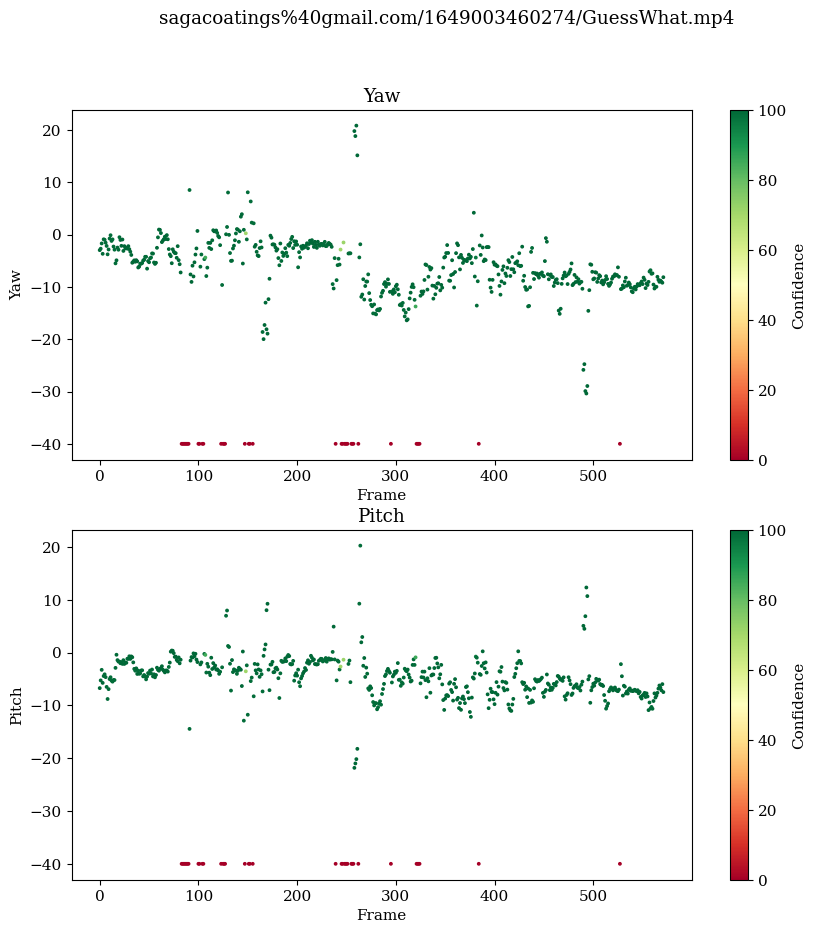

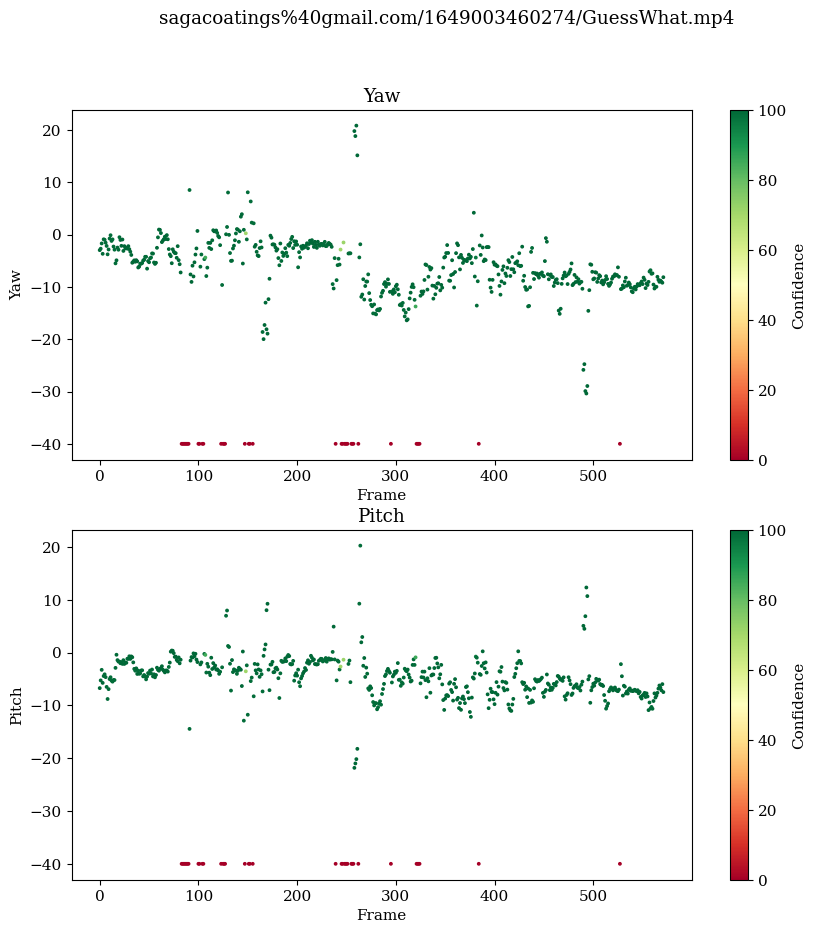

In [96]:
#We want to visualze the sequence of eye directions for a video
#We plot the yaw and pitch for a video small eye_gazing dataset
plot_yaw_pitch(df_filtered['eye_directions'][0], df_filtered['confidences'][0], video_key = df_filtered['video_key'][0])

In [97]:
df_filtered

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,Gender,GenderConf,Size,downsampling_count,fps,number_of_frames,total_confidence,number_of_frames_with_face,confidences,eye_directions
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,Female,99.6,0.236465,858,14.895833,572,99.438819,534,"[99.932861328125, 99.00003051757812, 99.040435...","[[-2.957106828689575, -6.7206130027771], [-2.6..."
1,1,sagacoatings%40gmail.com/1649443677729/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.7,29.8,600.0,800.0,...,Female,99.7,0.120666,859,14.887348,570,97.730921,408,"[99.92636108398438, 99.82949829101562, 99.0796...","[[-8.12035083770752, -10.779633522033691], [-7..."
2,2,_REVIEWED/remote_participants/claudiarathwick@...,claudiarathwick@gmail.com__Jacob,1,7.0,Male,89.1,25.0,360.0,480.0,...,Male,94.6,0.028115,1000,11.223345,1000,99.377062,317,"[99.99989318847656, 100.0, 99.99979400634766, ...","[[1.7810202836990356, 2.2886269092559814], [-0..."
3,3,sherylflynn5@gmail.com/1649453242/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,92.6,25.0,360.0,480.0,...,Female,90.4,0.151472,1000,10.799136,992,98.990505,419,"[99.99876403808594, None, None, None, None, No...","[[-23.315263748168945, -3.1237051486968994], [..."
4,4,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,94.6,25.0,360.0,480.0,...,Female,93.7,0.034413,1000,10.570825,975,99.006380,391,"[99.92616271972656, None, None, None, None, No...","[[13.27838134765625, -2.3714399337768555], [No..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,623,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.6,30.0,768.0,1024.0,...,Female,87.8,0.089018,575,9.982639,575,98.835605,446,"[100.0, 99.99999237060547, 99.0078353881836, N...","[[-2.703453779220581, -9.00334358215332], [-1...."
624,624,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,29.9,768.0,1024.0,...,Female,89.1,0.180934,861,14.973913,574,99.319437,478,"[99.99960327148438, 99.99935913085938, 99.9982...","[[4.584129810333252, -9.231253623962402], [4.3..."
625,625,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,30.0,768.0,1024.0,...,Female,96.5,0.197602,574,9.982609,574,99.573393,521,"[99.99803161621094, 99.99978637695312, 99.9999...","[[10.937582969665527, -12.633040428161621], [1..."
626,626,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.4,29.9,768.0,1024.0,...,Female,93.7,0.163169,860,14.982578,573,98.919363,426,"[99.00015258789062, 99.00237274169922, 99.8658...","[[9.93967342376709, 4.3936381340026855], [10.5..."


In [98]:
df_filtered.iloc[2]

Unnamed: 0                                                                    2
video_key                     _REVIEWED/remote_participants/claudiarathwick@...
child_id                                       claudiarathwick@gmail.com__Jacob
ASD                                                                           1
age                                                                           7
gender                                                                     Male
VideoDuration                                                              89.1
VideoFrameRate                                                               25
VideoFrameHeight                                                            360
VideoFrameWidth                                                             480
Confidence1                                                                99.2
Confidence2                                                                99.2
Sharpness                               

In [46]:
#We print the index and the pitch 
i = 1
for j in range(len(df_filtered.iloc[i]['eye_directions'])):
    print(j, df_filtered.iloc[i]['eye_directions'][j][1])

0 -10.779633522033691
1 -6.405028343200684
2 -7.109956741333008
3 -10.100557327270508
4 -9.899489402770996
5 -8.935798645019531
6 -9.1622896194458
7 -10.478633880615234
8 None
9 -10.47570514678955
10 -8.141775131225586
11 -8.503643989562988
12 -5.638431549072266
13 -5.889665603637695
14 -5.534114360809326
15 -4.4244608879089355
16 -4.906116008758545
17 -5.5093231201171875
18 -2.045217990875244
19 -3.4390456676483154
20 -0.7396290898323059
21 -2.3083038330078125
22 -3.350121259689331
23 -3.707576036453247
24 -2.8689792156219482
25 -3.6248810291290283
26 -3.2122631072998047
27 -3.3793160915374756
28 -2.532830238342285
29 -2.217888116836548
30 -2.8432929515838623
31 -2.153642416000366
32 -4.175192832946777
33 -2.510847568511963
34 -1.8773081302642822
35 -1.8474061489105225
36 None
37 None
38 None
39 None
40 None
41 None
42 None
43 None
44 None
45 None
46 None
47 None
48 None
49 None
50 None
51 None
52 -0.37311673164367676
53 None
54 -1.2000453472137451
55 0.5283394455909729
56 -0.13982558

In [ ]:
# We create a folder to store the plots
if not os.path.exists('plots/eye_directions_10_fps/'):
    os.makedirs('plots/eye_directions_10_fps/')


for i in range(len(df_filtered)):  # Limiting to the first 5 rows for demonstration
    try:
        video_key = df_filtered.iloc[i]['video_key']
        output_path = f"plots/eye_directions_10_fps/{i}.png"
        plot_yaw_pitch(df_filtered.iloc[i]['eye_directions'], df_filtered.iloc[i]['confidences'], output_path=output_path, video_key=video_key)

    except KeyError as e:
        print(f"Error at index {i}: {e}")

## V. Downsample to 5 fps

We downsample the eye direction to 5 fps by averaging out pitch and yaw.

In [99]:
def downsample_5fps(row):
    """This function downsamples the eye_directions and confidences lists to 5 fps by
    averaging the pitch and the yaw.
    It returns the new eye_directions and confidences lists and the new number_of_frames."""
    eye_directions = row['eye_directions']
    confidences = row['confidences']
    number_of_frames = row['number_of_frames']

    #We downsample the eye_directions and confidences lists to 5 fps
    eye_directions = [list(np.mean(eye_directions[i:i+2], axis=0)) for i in range(0, len(eye_directions), 2)]
    confidences = [np.mean(confidences[i:i+2]) for i in range(0, len(confidences), 2)]
    #We update the number of frames
    number_of_frames = len(eye_directions)
    #We update the row
    row['eye_directions'] = eye_directions
    row['confidences'] = confidences
    row['number_of_frames'] = number_of_frames
    return row

In [100]:
def downsample_5fps(row):
    """This function downsamples the eye_directions and confidences lists to 5 fps by
    averaging the pitch and the yaw. It skips 'None' values during downsampling.
    Returns the new eye_directions and confidences lists and the new number_of_frames."""
    eye_directions = row['eye_directions']
    confidences = row['confidences']
    number_of_frames = row['number_of_frames']

    # Initialize lists to store downsampled values
    new_eye_directions = []
    new_confidences = []

    # Iterate through the original lists with a step of 2
    for i in range(0, len(eye_directions), 2):
        # Extract two consecutive elements
        pair_eye_directions = eye_directions[i:i+2]
        pair_confidences = confidences[i:i+2]

        # Filter out 'None' values
        pair_eye_directions = [elem for elem in pair_eye_directions if elem != [None, None]]
        pair_confidences = [elem for elem in pair_confidences if elem is not None]

        # Calculate the mean and append to the new lists
        if pair_eye_directions:
            new_eye_directions.append(list(np.mean(pair_eye_directions, axis=0)))
        if pair_confidences:
            new_confidences.append(np.mean(pair_confidences))
        
        # If both lists are empty, append None to the new lists
        if not pair_eye_directions and not pair_confidences:
            new_eye_directions.append([None, None])
            new_confidences.append(None)

    # Update the number of frames
    number_of_frames = len(new_eye_directions)

    # Update the row
    row['eye_directions'] = new_eye_directions
    row['confidences'] = new_confidences
    row['number_of_frames'] = number_of_frames

    return row

In [101]:
#We test the downsample_5fps function (1 row)
df_test = pd.DataFrame({
    'eye_directions': [[[1, 2], [3, 4], [5, 6], [7, 8], [9, 10], [None, None], [None, None], [None, None]]],
    'confidences': [[0, 1, 0, 1, 1, None, None, None]],
    'number_of_frames': [4]
})

df_test = df_test.apply(downsample_5fps, axis=1)

assert df_test['eye_directions'][0] == [[2.0,3.0], [6.0,7.0], [9, 10], [None, None]]
assert df_test['confidences'][0] == [0.5, 0.5, 1.0, None]
assert df_test['number_of_frames'][0] == 4

In [102]:
#We apply it to the whole dataset
df_downsampled = df_filtered.copy()
df_downsampled = df_downsampled.apply(downsample_5fps, axis=1)

In [103]:
#We run some sanity checks on the downsampled dataset

#We check that the number of frames is the length of the list of confidences
for i in range(len(df_downsampled)):
    assert len(df_downsampled.iloc[i]['confidences']) == df_downsampled.iloc[i]['number_of_frames']

#We check that the length of the list of eye_directions is the same as the length of the list of confidences
for i in range(len(df_downsampled)):
    assert len(df_downsampled.iloc[i]['eye_directions']) == len(df_downsampled.iloc[i]['confidences'])


In [104]:
#We set the number_of_frames_with_face to the number of non None confidences and the number_of_frames to the length of the confidences list
#We also set the total_confidence to the average of the confidences

def update_nb_frames_and_total_confidence(row):
    """This function computes the number of frames with face for a given video. 
    It also computes the total confidence for a given video.
    It returns the updated row."""
    confidences = row['confidences']
    number_of_frames_with_face = len([x for x in confidences if x is not None])
    number_of_frames = len(confidences)
    total_confidence = sum([x for x in confidences if x is not None])/number_of_frames_with_face
    row['number_of_frames_with_face'] = number_of_frames_with_face
    row['number_of_frames'] = number_of_frames
    row['total_confidence'] = total_confidence
    return row

In [105]:
#We apply the update_nb_frames_and_total_confidence function to the dataframe
df_downsampled = df_downsampled.apply(update_nb_frames_and_total_confidence, axis=1)

In [106]:
#We check that the number of frames with face is the length of the list of confidences without None values
for i in range(len(df_downsampled)):
    assert df_downsampled.iloc[i]['number_of_frames_with_face'] == len([x for x in df_downsampled.iloc[i]['confidences'] if x is not None])

#We check that the total number of frames is the length of the list of confidences
for i in range(len(df_downsampled)):
    assert df_downsampled.iloc[i]['number_of_frames'] == len(df_downsampled.iloc[i]['confidences'])
    
#We check that the total confidence is the sum of the confidences divided by the number of frames with face
for i in range(len(df_downsampled)):
    #We round the total confidence to 2 decimals
    total_confidence = round(df_downsampled.iloc[i]['total_confidence'],2)
    #We round the average confidence to 2 decimals
    average_confidence = round(sum([x for x in df_downsampled.iloc[i]['confidences'] if x is not None])/df_downsampled.iloc[i]['number_of_frames_with_face'],2)
    assert total_confidence == average_confidence

#We check that the max of total confidence is <=100 and the min is <=0
max_total_confidence = max(df_downsampled['total_confidence'])
min_total_confidence = min(df_downsampled['total_confidence'])
assert max_total_confidence <= 100
assert min_total_confidence >= 0

In [108]:
df_downsampled

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,Gender,GenderConf,Size,downsampling_count,fps,number_of_frames,total_confidence,number_of_frames_with_face,confidences,eye_directions
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,Female,99.6,0.236465,858,14.895833,286,99.303988,276,"[99.46644592285156, 99.42637252807617, 99.0805...","[[-2.819887161254883, -5.989731550216675], [-2..."
1,1,sagacoatings%40gmail.com/1649443677729/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.7,29.8,600.0,800.0,...,Female,99.7,0.120666,859,14.887348,285,97.441161,224,"[99.8779296875, 99.06116104125977, 99.02965927...","[[-8.003300189971924, -8.592330932617188], [-7..."
2,2,_REVIEWED/remote_participants/claudiarathwick@...,claudiarathwick@gmail.com__Jacob,1,7.0,Male,89.1,25.0,360.0,480.0,...,Male,94.6,0.028115,1000,11.223345,500,99.187526,173,"[99.99994659423828, 99.99987030029297, 100.0, ...","[[0.6411803960800171, 1.985705316066742], [6.3..."
3,3,sherylflynn5@gmail.com/1649453242/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,92.6,25.0,360.0,480.0,...,Female,90.4,0.151472,1000,10.799136,496,98.854258,257,"[99.99876403808594, None, None, None, None, No...","[[-23.315263748168945, -3.1237051486968994], [..."
4,4,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,94.6,25.0,360.0,480.0,...,Female,93.7,0.034413,1000,10.570825,488,98.849446,255,"[99.92616271972656, None, None, None, 99.97464...","[[13.27838134765625, -2.3714399337768555], [No..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,623,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.6,30.0,768.0,1024.0,...,Female,87.8,0.089018,575,9.982639,288,98.742166,241,"[99.99999618530273, 99.0078353881836, None, No...","[[-2.055677354335785, -8.819129943847656], [-2..."
624,624,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,29.9,768.0,1024.0,...,Female,89.1,0.180934,861,14.973913,287,99.200617,256,"[99.99948120117188, 99.99454879760742, 99.9986...","[[4.483477592468262, -9.937378883361816], [3.9..."
625,625,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,30.0,768.0,1024.0,...,Female,96.5,0.197602,574,9.982609,287,99.548925,265,"[99.99890899658203, 99.99998092651367, 100.0, ...","[[11.267480850219727, -12.519931316375732], [5..."
626,626,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.4,29.9,768.0,1024.0,...,Female,93.7,0.163169,860,14.982578,287,98.622483,238,"[99.00126266479492, 99.44585037231445, 99.0073...","[[10.24967098236084, 4.20268702507019], [10.02..."


In [109]:
#We save the downsampled dataset
df_downsampled.to_csv('starting_dataset_rekognition_preprocessed_5fps.csv', index=False)

In [ ]:
# We create a folder to store the plots
if not os.path.exists('plots/eye_directions_5_fps/'):
    os.makedirs('plots/eye_directions_5_fps/')


for i in range(len(df_downsampled)):  # Limiting to the first 5 rows for demonstration
    try:
        video_key = df_downsampled.iloc[i]['video_key']
        output_path = f"plots/eye_directions_5_fps/{i}.png"
        plot_yaw_pitch(df_downsampled.iloc[i]['eye_directions'], df_downsampled.iloc[i]['confidences'], output_path=output_path, video_key=video_key)

    except KeyError as e:
        print(f"Error at index {i}: {e}")

### VI. We notice big chunks of None value in our features. We design an algorithm to only keep accept approximately continuous eye gazing windows. 

In [110]:
df_downsampled['eye_directions'][0] 

[[-2.819887161254883, -5.989731550216675],
 [-2.6659501791000366, -4.494826674461365],
 [-0.9277238547801971, -4.269177675247192],
 [-1.840688943862915, -5.563696622848511],
 [-3.292689323425293, -7.848320007324219],
 [-0.4207380786538124, -4.832557201385498],
 [-1.0448187589645386, -5.400401592254639],
 [-2.5682214498519897, -5.186372518539429],
 [-5.191657543182373, -1.6423304229974747],
 [-2.671225428581238, -1.555353045463562],
 [-0.7459897845983505, -1.8565164804458618],
 [-1.5282617211341858, -1.9581993222236633],
 [-2.6489895582199097, -1.7826271653175354],
 [-2.571810245513916, -1.8920015096664429],
 [-2.4343637228012085, -1.1694372296333313],
 [-3.009658098220825, -0.9422000050544739],
 [-4.622380375862122, -0.7994718551635742],
 [-5.033502578735352, -2.46248459815979],
 [-5.0278000831604, -3.202080011367798],
 [-5.687766790390015, -3.7147642374038696],
 [-5.825524568557739, -3.9623138904571533],
 [-5.492664575576782, -3.367981195449829],
 [-4.875495910644531, -4.3701472282409

In [111]:
def truncate_confidence(sequence):
    """This function truncates a sequence that has None at the beginning or at the end."""
    #We get the index of the first non None value
    first_non_none_index = sequence.index(next(x for x in sequence if x is not None))
    #We get the index of the last non None value
    last_non_none_index = len(sequence) - sequence[::-1].index(next(x for x in sequence[::-1] if x is not None)) - 1
    #We truncate the sequence
    sequence = sequence[first_non_none_index:last_non_none_index+1]
    return sequence

def truncate_eye_directions(sequence):
    """This function truncates a sequence of eye directions that has [None, None] at the beginning or at the end."""
    #We get the index of the first non [None, None] value
    first_non_none_index = sequence.index(next(x for x in sequence if x != [None, None]))
    #We get the index of the last non [None, None] value
    last_non_none_index = len(sequence) - sequence[::-1].index(next(x for x in sequence[::-1] if x != [None, None])) - 1
    #We truncate the sequence
    sequence = sequence[first_non_none_index:last_non_none_index+1]
    return sequence

In [112]:
#We test the truncate function
confidence = [None, None, None, 1, 2, 3, None, None]
assert truncate_confidence(confidence) == [1, 2, 3]

#We test the truncate_eye_directions function
eye_directions = [[None, None], [None, None], [None, None], [1, 2], [3, 4], [5, 6], [None, None], [None, None]]
assert truncate_eye_directions(eye_directions) == [[1, 2], [3, 4], [5, 6]]

In [113]:
#We define a function to cut the eye directions into windows of continuous time series with no more than s seconds of
#missing data in between

def cut_into_windows(row, s):
    """This function cuts the eye_directions and confidences lists into windows of continuous time series with no more than s seconds of
    missing data in between. It returns a list of windows in the column Windows. Each window is a dictionary with the following keys:"""
    
    eye_directions = row['eye_directions']
    confidences = row['confidences']

    eye_directions_windows = []
    confidences_windows = []
    total_confidence_windows = []
    number_of_frames_with_face_windows = []
   
    #We initialize the number of frames with face in the window to 0
    number_of_frames_with_face = 0
    #We initialize the total confidence in the window to 0
    total_confidence = 0
    #We initialize the number of None values in the window to 0
    number_of_consecutive_none = 0
    #We initialize the list of eye directions in the window to []
    eye_directions_window = []
    #We initialize the list of confidences in the window to []
    confidences_window = []
    
    i = 0
    #We iterate through the eye_directions and confidences lists
    while i < len(eye_directions):
        eye_directions_window.append(eye_directions[i])
        confidences_window.append(confidences[i])
        # print(confidences_window)
        #If the eye_directions[i] is not [None, None]
        if eye_directions[i] != [None, None]:
            #We set the number_of_consecutive_none to 0
            number_of_consecutive_none = 0
    
        #If the eye_directions[i] is None
        else:
            #We increment the number of None values in the window
            number_of_consecutive_none += 1
    

        #If the number of None values in the window is greater than s*10
        if number_of_consecutive_none > s*5:

            confidences_window_without_none = [x for x in confidences_window if x is not None]

            #We only append the window if there is at least one non None value in the window
            if len(confidences_window_without_none) != 0:
                #We compute the total confidence in the window
                total_confidence = sum([x for x in confidences_window if x is not None])
                total_confidence = total_confidence/len([x for x in confidences_window if x is not None])
                
                #We compute the number of frames with face in the window
                number_of_frames_with_face = len([x for x in confidences_window if x is not None])

                #We delete truncate the window from the beginning None values and the end None values
                eye_directions_window = truncate_eye_directions(eye_directions_window)
                confidences_window = truncate_confidence(confidences_window)
                
                eye_directions_windows.append(eye_directions_window)
                confidences_windows.append(confidences_window)
                total_confidence_windows.append(total_confidence)
                number_of_frames_with_face_windows.append(number_of_frames_with_face)

            #We reset everything
            number_of_consecutive_none = 0
            eye_directions_window = []
            confidences_window = []
            total_confidence = 0
            number_of_frames_with_face = 0
        
        #If we are at the end of the list, we append the last window
        if i == len(eye_directions) - 1:
            confidences_window_without_none = [x for x in confidences_window if x is not None]

            #We only append the window if there is at least one non None value in the window
            if len(confidences_window_without_none) != 0:
                #We compute the total confidence in the window
                total_confidence = sum([x for x in confidences_window if x is not None])
                total_confidence = total_confidence/len([x for x in confidences_window if x is not None])
                
                #We compute the number of frames with face in the window
                number_of_frames_with_face = len([x for x in confidences_window if x is not None])
                
                #We delete truncate the window from the beginning None values and the end None values
                eye_directions_window = truncate_eye_directions(eye_directions_window)
                confidences_window = truncate_confidence(confidences_window)

                eye_directions_windows.append(eye_directions_window)
                confidences_windows.append(confidences_window)
                total_confidence_windows.append(total_confidence)
                number_of_frames_with_face_windows.append(number_of_frames_with_face)

        i += 1

    #We set the new columns
    row['eye_directions_windows'] = eye_directions_windows
    row['confidences_windows'] = confidences_windows
    row['total_confidence_windows'] = total_confidence_windows
    row['number_of_frames_with_face_windows'] = number_of_frames_with_face_windows

    return row

In [114]:
#We test the cut_into_windows function on the first row
df_first_row = df_downsampled.iloc[0:1].copy()
df_first_row = df_first_row.apply(cut_into_windows, axis=1, args=(1,))
df_first_row

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,fps,number_of_frames,total_confidence,number_of_frames_with_face,confidences,eye_directions,eye_directions_windows,confidences_windows,total_confidence_windows,number_of_frames_with_face_windows
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,14.895833,286,99.303988,276,"[99.46644592285156, 99.42637252807617, 99.0805...","[[-2.819887161254883, -5.989731550216675], [-2...","[[[-2.819887161254883, -5.989731550216675], [-...","[[99.46644592285156, 99.42637252807617, 99.080...",[99.30398800062096],[276]


In [115]:
df_test = df_downsampled.copy()
df_test = df_test.apply(cut_into_windows, args=(2,), axis=1)
df_test

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,fps,number_of_frames,total_confidence,number_of_frames_with_face,confidences,eye_directions,eye_directions_windows,confidences_windows,total_confidence_windows,number_of_frames_with_face_windows
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,14.895833,286,99.303988,276,"[99.46644592285156, 99.42637252807617, 99.0805...","[[-2.819887161254883, -5.989731550216675], [-2...","[[[-2.819887161254883, -5.989731550216675], [-...","[[99.46644592285156, 99.42637252807617, 99.080...",[99.30398800062096],[276]
1,1,sagacoatings%40gmail.com/1649443677729/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.7,29.8,600.0,800.0,...,14.887348,285,97.441161,224,"[99.8779296875, 99.06116104125977, 99.02965927...","[[-8.003300189971924, -8.592330932617188], [-7...","[[[-8.003300189971924, -8.592330932617188], [-...","[[99.8779296875, 99.06116104125977, 99.0296592...","[97.61661138290015, 97.03865802989287]","[156, 68]"
2,2,_REVIEWED/remote_participants/claudiarathwick@...,claudiarathwick@gmail.com__Jacob,1,7.0,Male,89.1,25.0,360.0,480.0,...,11.223345,500,99.187526,173,"[99.99994659423828, 99.99987030029297, 100.0, ...","[[0.6411803960800171, 1.985705316066742], [6.3...","[[[0.6411803960800171, 1.985705316066742], [6....","[[99.99994659423828, 99.99987030029297, 100.0,...","[99.90598487854004, 99.38115383329846, 98.7669...","[4, 21, 72, 3, 66, 7]"
3,3,sherylflynn5@gmail.com/1649453242/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,92.6,25.0,360.0,480.0,...,10.799136,496,98.854258,257,"[99.99876403808594, None, None, None, None, No...","[[-23.315263748168945, -3.1237051486968994], [...","[[[-23.315263748168945, -3.1237051486968994]],...","[[99.99876403808594], [98.67819213867188, 93.0...","[99.99876403808594, 98.21808433532715, 99.0151...","[1, 38, 68, 10, 10, 39, 91]"
4,4,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,94.6,25.0,360.0,480.0,...,10.570825,488,98.849446,255,"[99.92616271972656, None, None, None, 99.97464...","[[13.27838134765625, -2.3714399337768555], [No...","[[[13.27838134765625, -2.3714399337768555], [N...","[[99.92616271972656, None, None, None, 99.9746...","[98.24194145202637, 98.82518941705877, 99.7353...","[8, 11, 103, 50, 35, 21, 27]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,623,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.6,30.0,768.0,1024.0,...,9.982639,288,98.742166,241,"[99.99999618530273, 99.0078353881836, None, No...","[[-2.055677354335785, -8.819129943847656], [-2...","[[[-2.055677354335785, -8.819129943847656], [-...","[[99.99999618530273, 99.0078353881836, None, N...",[98.74216594142044],[241]
624,624,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,29.9,768.0,1024.0,...,14.973913,287,99.200617,256,"[99.99948120117188, 99.99454879760742, 99.9986...","[[4.483477592468262, -9.937378883361816], [3.9...","[[[4.483477592468262, -9.937378883361816], [3....","[[99.99948120117188, 99.99454879760742, 99.998...",[99.2006166279316],[256]
625,625,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,30.0,768.0,1024.0,...,9.982609,287,99.548925,265,"[99.99890899658203, 99.99998092651367, 100.0, ...","[[11.267480850219727, -12.519931316375732], [5...","[[[11.267480850219727, -12.519931316375732], [...","[[99.99890899658203, 99.99998092651367, 100.0,...",[99.54892455766786],[265]
626,626,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.4,29.9,768.0,1024.0,...,14.982578,287,98.622483,238,"[99.00126266479492, 99.44585037231445, 99.0073...","[[10.24967098236084, 4.20268702507019], [10.02...","[[[10.24967098236084, 4.20268702507019], 

In [602]:
#We save the dataset
df_test.to_csv('starting_dataset_rekognition_5fps_windows.csv', index=False)

In [603]:
df_test

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,fps,number_of_frames,total_confidence,number_of_frames_with_face,confidences,eye_directions,eye_directions_windows,confidences_windows,total_confidence_windows,number_of_frames_with_face_windows
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,14.895833,286,99.303988,276,"[99.46644592285156, 99.42637252807617, 99.0805...","[[-2.819887161254883, -5.989731550216675], [-2...","[[[-2.819887161254883, -5.989731550216675], [-...","[[99.46644592285156, 99.42637252807617, 99.080...",[99.30398800062096],[276]
1,1,sagacoatings%40gmail.com/1649443677729/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.7,29.8,600.0,800.0,...,14.887348,285,97.441161,224,"[99.8779296875, 99.06116104125977, 99.02965927...","[[-8.003300189971924, -8.592330932617188], [-7...","[[[-8.003300189971924, -8.592330932617188], [-...","[[99.8779296875, 99.06116104125977, 99.0296592...","[97.61661138290015, 97.03865802989287]","[156, 68]"
2,2,_REVIEWED/remote_participants/claudiarathwick@...,claudiarathwick@gmail.com__Jacob,1,7.0,Male,89.1,25.0,360.0,480.0,...,11.223345,500,99.187526,173,"[99.99994659423828, 99.99987030029297, 100.0, ...","[[0.6411803960800171, 1.985705316066742], [6.3...","[[[0.6411803960800171, 1.985705316066742], [6....","[[99.99994659423828, 99.99987030029297, 100.0,...","[99.90598487854004, 99.38115383329846, 98.7669...","[4, 21, 72, 3, 66, 7]"
3,3,sherylflynn5@gmail.com/1649453242/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,92.6,25.0,360.0,480.0,...,10.799136,496,98.854258,257,"[99.99876403808594, None, None, None, None, No...","[[-23.315263748168945, -3.1237051486968994], [...","[[[-23.315263748168945, -3.1237051486968994]],...","[[99.99876403808594], [98.67819213867188, 93.0...","[99.99876403808594, 98.21808433532715, 99.0151...","[1, 38, 68, 10, 10, 39, 91]"
4,4,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,94.6,25.0,360.0,480.0,...,10.570825,488,98.849446,255,"[99.92616271972656, None, None, None, 99.97464...","[[13.27838134765625, -2.3714399337768555], [No...","[[[13.27838134765625, -2.3714399337768555], [N...","[[99.92616271972656, None, None, None, 99.9746...","[98.24194145202637, 98.82518941705877, 99.7353...","[8, 11, 103, 50, 35, 21, 27]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,623,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.6,30.0,768.0,1024.0,...,9.982639,288,98.742166,241,"[99.99999618530273, 99.0078353881836, None, No...","[[-2.055677354335785, -8.819129943847656], [-2...","[[[-2.055677354335785, -8.819129943847656], [-...","[[99.99999618530273, 99.0078353881836, None, N...",[98.74216594142044],[241]
624,624,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,29.9,768.0,1024.0,...,14.973913,287,99.200617,256,"[99.99948120117188, 99.99454879760742, 99.9986...","[[4.483477592468262, -9.937378883361816], [3.9...","[[[4.483477592468262, -9.937378883361816], [3....","[[99.99948120117188, 99.99454879760742, 99.998...",[99.2006166279316],[256]
625,625,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,30.0,768.0,1024.0,...,9.982609,287,99.548925,265,"[99.99890899658203, 99.99998092651367, 100.0, ...","[[11.267480850219727, -12.519931316375732], [5...","[[[11.267480850219727, -12.519931316375732], [...","[[99.99890899658203, 99.99998092651367, 100.0,...",[99.54892455766786],[265]
626,626,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.4,29.9,768.0,1024.0,...,14.982578,287,98.622483,238,"[99.00126266479492, 99.44585037231445, 99.0073...","[[10.24967098236084, 4.20268702507019], [10.02...","[[[10.24967098236084, 4.20268702507019], 

In [604]:
#We take the max window size for each video
def select_max_window_size(row):
    """This function selects the max window size for a given video. 
    It returns the updated row."""
    eye_directions_windows = row['eye_directions_windows']
    confidences_windows = row['confidences_windows']
    total_confidence_windows = row['total_confidence_windows']
    number_of_frames_with_face_windows = row['number_of_frames_with_face_windows']

    #We get the index of the max window size
    index_max_window_size = np.argmax(number_of_frames_with_face_windows)
    #We get the max window size
    max_window_size = number_of_frames_with_face_windows[index_max_window_size]
    #We get the eye_directions of the max window size
    eye_directions_max_window_size = eye_directions_windows[index_max_window_size]
    #We get the confidences of the max window size
    confidences_max_window_size = confidences_windows[index_max_window_size]
    #We get the total confidence of the max window size
    total_confidence_max_window_size = total_confidence_windows[index_max_window_size]
    #We get the number of frames with face of the max window size
    number_of_frames_with_face_max_window_size = number_of_frames_with_face_windows[index_max_window_size]

    #We set the new columns
    row['max_window_size'] = max_window_size
    row['eye_directions_max_window_size'] = eye_directions_max_window_size
    row['confidences_max_window_size'] = confidences_max_window_size
    row['total_confidence_max_window_size'] = total_confidence_max_window_size
    row['number_of_frames_with_face_max_window_size'] = number_of_frames_with_face_max_window_size

    return row

In [605]:
# We apply the select_max_window_size function to the dataframe
df_test = df_test.apply(select_max_window_size, axis=1)
df_test

,Unnamed: 0,video_key,child_id,ASD,age,gender,VideoDuration,VideoFrameRate,VideoFrameHeight,VideoFrameWidth,...,eye_directions,eye_directions_windows,confidences_windows,total_confidence_windows,number_of_frames_with_face_windows,max_window_size,eye_directions_max_window_size,confidences_max_window_size,total_confidence_max_window_size,number_of_frames_with_face_max_window_size
0,0,sagacoatings%40gmail.com/1649003460274/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.6,29.8,600.0,800.0,...,"[[-2.819887161254883, -5.989731550216675], [-2...","[[[-2.819887161254883, -5.989731550216675], [-...","[[99.46644592285156, 99.42637252807617, 99.080...",[99.30398800062096],[276],276,"[[-2.819887161254883, -5.989731550216675], [-2...","[99.46644592285156, 99.42637252807617, 99.0805...",99.303988,276
1,1,sagacoatings%40gmail.com/1649443677729/GuessWh...,sagacoatings@gmail.com__lynette,1,10.0,Female,57.7,29.8,600.0,800.0,...,"[[-8.003300189971924, -8.592330932617188], [-7...","[[[-8.003300189971924, -8.592330932617188], [-...","[[99.8779296875, 99.06116104125977, 99.0296592...","[97.61661138290015, 97.03865802989287]","[156, 68]",156,"[[-8.003300189971924, -8.592330932617188], [-7...","[99.8779296875, 99.06116104125977, 99.02965927...",97.616611,156
2,2,_REVIEWED/remote_participants/claudiarathwick@...,claudiarathwick@gmail.com__Jacob,1,7.0,Male,89.1,25.0,360.0,480.0,...,"[[0.6411803960800171, 1.985705316066742], [6.3...","[[[0.6411803960800171, 1.985705316066742], [6....","[[99.99994659423828, 99.99987030029297, 100.0,...","[99.90598487854004, 99.38115383329846, 98.7669...","[4, 21, 72, 3, 66, 7]",72,"[[2.4300050735473633, -0.4833460748195648], [N...","[78.8230209350586, None, None, None, 99.992813...",98.766989,72
3,3,sherylflynn5@gmail.com/1649453242/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,92.6,25.0,360.0,480.0,...,"[[-23.315263748168945, -3.1237051486968994], [...","[[[-23.315263748168945, -3.1237051486968994]],...","[[99.99876403808594], [98.67819213867188, 93.0...","[99.99876403808594, 98.21808433532715, 99.0151...","[1, 38, 68, 10, 10, 39, 91]",91,"[[-2.7745728492736816, -7.986929893493652], [-...","[99.98541641235352, 99.99972915649414, 99.9992...",98.531428,91
4,4,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,sherylflynn5@gmail.com__AJ Nowosielski,1,0.0,Male,94.6,25.0,360.0,480.0,...,"[[13.27838134765625, -2.3714399337768555], [No...","[[[13.27838134765625, -2.3714399337768555], [N...","[[99.92616271972656, None, None, None, 99.9746...","[98.24194145202637, 98.82518941705877, 99.7353...","[8, 11, 103, 50, 35, 21, 27]",103,"[[1.8764745891094208, 7.376553058624268], [-5....","[99.51169967651367, 99.99689483642578, 99.9984...",99.735367,103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
623,623,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.6,30.0,768.0,1024.0,...,"[[-2.055677354335785, -8.819129943847656], [-2...","[[[-2.055677354335785, -8.819129943847656], [-...","[[99.99999618530273, 99.0078353881836, None, N...",[98.74216594142044],[241],241,"[[-2.055677354335785, -8.819129943847656], [-2...","[99.99999618530273, 99.0078353881836, None, No...",98.742166,241
624,624,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,29.9,768.0,1024.0,...,"[[4.483477592468262, -9.937378883361816], [3.9...","[[[4.483477592468262, -9.937378883361816], [3....","[[99.99948120117188, 99.99454879760742, 99.998...",[99.2006166279316],[256],256,"[[4.483477592468262, -9.937378883361816], [3.9...","[99.99948120117188, 99.99454879760742, 99.9986...",99.200617,256
625,625,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,sabrinfatemaa@gmail.com__Apurbo,0,11.0,Male,57.5,30.0,768.0,1024.0,...,"[[11.267480850219727, -12.519931316375732], [5...","[[[11.267480850219727, -12.519931316375732], [...","[[99.99890899658203, 99.99998092651367, 100.0,...",[99.54892455766786],[265],265,"[[11.2674808

/Users/mariehuynh/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 0, 'Max window size')

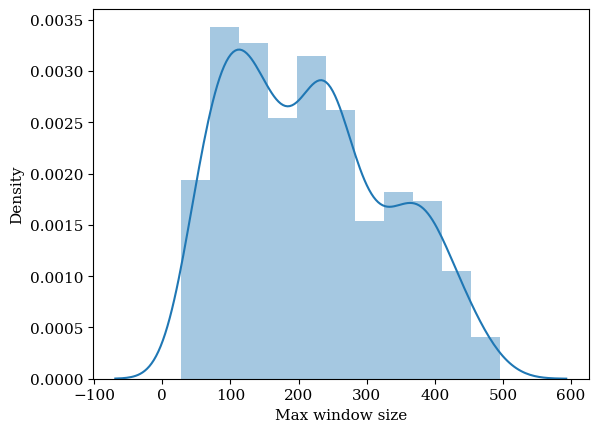

In [606]:
#We plot a histogram of the max window size
sns.distplot(df_test['max_window_size'], kde=True)
plt.xlabel('Max window size')

In [607]:
#We look at the distribution of the max window size
df_test['max_window_size'].describe()

count    582.000000
mean     216.646048
std      115.596850
min       28.000000
25%      118.250000
50%      212.500000
75%      300.000000
max      496.000000
Name: max_window_size, dtype: float64

In [608]:
#We look at how many videos have under 20 seconds of eye direction data
temp = df_test[df_test['max_window_size'] <= 20*5]
temp['ASD'].value_counts()

1    87
0    20
Name: ASD, dtype: int64

In [609]:
#We only select the videos with more than 20 seconds of eye direction data
df_final = df_test[df_test['max_window_size'] > 20*5]
df_final['ASD'].value_counts()

1    356
0    119
Name: ASD, dtype: int64

We look through the windows of the NT children and create more rows in our dataframe.

In [611]:
df_final.reset_index(inplace=True, drop=True)

In [617]:
def add_NT_rows(df):
    """This function creates a final dataset with more rows for NT children."""
    df_final = pd.DataFrame(columns=df.columns)
    #We on;y keep the columns that we need
    df_final = df_final[['video_key', 'ASD', 'child_id', 'age', 'gender', 'eye_directions', 'confidences', 'total_confidence', 'number_of_frames_with_face']]

    for i in range(len(df)):
        label = df.iloc[i]['ASD']
        #If the label is 0 (NT)
        if (label == 0) :
            #For each window of more than 20 seconds of eye direction data, we create a new row
            eye_directions_windows = df['eye_directions_windows'][i] 
            confidences_windows = df['confidences_windows'][i]
            total_confidence_windows = df['total_confidence_windows'][i]
            number_of_frames_with_face_windows = df['number_of_frames_with_face_windows'][i]

            for eye_dir, conf, total_conf, nb_frames_face in zip(eye_directions_windows, confidences_windows, total_confidence_windows, number_of_frames_with_face_windows):
                #If the window is more than 20 seconds of eye direction data
                if nb_frames_face > 20*5:
                    #We create a new row
                    # Create a new row as a dictionary
                    new_row = {
                        'video_key': [df.at[i, 'video_key']],
                        'ASD': [df.at[i, 'ASD']],
                        'child_id': [df.at[i, 'child_id']],
                        'age': [df.at[i, 'age']],
                        'gender': [df.at[i, 'gender']],
                        'eye_directions': [eye_dir],
                        'confidences': [conf],
                        'total_confidence': [total_conf],
                        'number_of_frames_with_face': [nb_frames_face]
                    }
                    new_df = pd.DataFrame(new_row, index=[0])
                    
                    #We append the new row to the dataframe
                    df_final = pd.concat([df_final, new_df], ignore_index=True)

        #If the label is 1 (ASD)
        else:
            #We append the row with the max window size to the dataframe
            new_row = pd.DataFrame({
                'video_key': [df.at[i, 'video_key']],
                'ASD': [df.at[i, 'ASD']],
                'child_id': [df.at[i, 'child_id']],
                'age': [df.at[i, 'age']],
                'gender': [df.at[i, 'gender']],
                'eye_directions': [df.at[i, 'eye_directions_max_window_size']],
                'confidences': [df.at[i, 'confidences_max_window_size']],
                'total_confidence': [df.at[i, 'total_confidence_max_window_size']],
                'number_of_frames_with_face': [df.at[i, 'number_of_frames_with_face_max_window_size']]
            })
            new_df = pd.DataFrame(new_row, index=[0])
            #We concatenate the new row to the dataframe
            df_final = pd.concat([df_final, new_df], ignore_index=True)
    return df_final

In [618]:
df_new_rows = add_NT_rows(df_final)

In [619]:
df_new_rows

,video_key,ASD,child_id,age,gender,eye_directions,confidences,total_confidence,number_of_frames_with_face
0,sagacoatings%40gmail.com/1649003460274/GuessWh...,1,sagacoatings@gmail.com__lynette,10.0,Female,"[[-2.819887161254883, -5.989731550216675], [-2...","[99.46644592285156, 99.42637252807617, 99.0805...",99.303988,276
1,sagacoatings%40gmail.com/1649443677729/GuessWh...,1,sagacoatings@gmail.com__lynette,10.0,Female,"[[-8.003300189971924, -8.592330932617188], [-7...","[99.8779296875, 99.06116104125977, 99.02965927...",97.616611,156
2,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,1,sherylflynn5@gmail.com__AJ Nowosielski,0.0,Male,"[[1.8764745891094208, 7.376553058624268], [-5....","[99.51169967651367, 99.99689483642578, 99.9984...",99.735367,103
3,lavalleevalerie@yahoo.com/1646879575/GuessWhat...,1,lavalleevalerie@yahoo.com__Catherine Lavallee,0.0,Female,"[[-3.2374602556228638, -5.52520489692688], [-6...","[99.98519134521484, 99.86570358276367, 99.9819...",99.855054,416
4,lavalleevalerie@yahoo.com/1645389917/GuessWhat...,1,lavalleevalerie@yahoo.com__Catherine Lavallee,0.0,Female,"[[-12.626811981201172, -10.13326382637024], [N...","[90.93453216552734, None, 99.99822998046875, 9...",98.401824,140
...,...,...,...,...,...,...,...,...,...
491,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[-2.055677354335785, -8.819129943847656], [-2...","[99.99999618530273, 99.0078353881836, None, No...",98.742166,241
492,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[4.483477592468262, -9.937378883361816], [3.9...","[99.99948120117188, 99.99454879760742, 99.9986...",99.200617,256
493,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[11.267480850219727, -12.519931316375732], [5...","[99.99890899658203, 99.99998092651367, 100.0, ...",99.548925,265
494,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[10.24967098236084, 4.20268702507019], [10.02...","[99.00126266479492, 99.44585037231445, 99.0073...",98.622483,238


In [620]:
#We look at the distribution of the labels
df_new_rows['ASD'].value_counts()

1    356
0    140
Name: ASD, dtype: int64

/Users/mariehuynh/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot: xlabel='number_of_frames_with_face', ylabel='Density'>

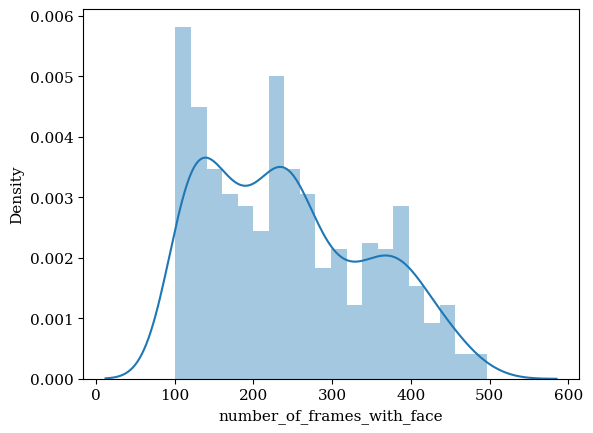

In [621]:
#We plot the number of frames with face for each video
sns.distplot(df_new_rows['number_of_frames_with_face'], kde=True, bins=20)

In [622]:
df_new_rows['eye_directions'][4]

[[-12.626811981201172, -10.13326382637024],
 [None, None],
 [-9.92149829864502, -19.419249534606934],
 [-8.044448375701904, -17.975396156311035],
 [-7.107466220855713, -17.855814933776855],
 [-8.81644606590271, -17.690110206604004],
 [-9.95021915435791, -18.46511745452881],
 [-17.111019134521484, -3.4199085235595703],
 [None, None],
 [None, None],
 [10.094578742980957, -0.415416955947876],
 [-7.434863567352295, -11.202844858169556],
 [-10.728805541992188, -16.193559169769287],
 [-6.282013893127441, -24.436603546142578],
 [-1.4788125455379486, -21.452719688415527],
 [-3.096753567457199, -23.547183990478516],
 [-5.448277950286865, -17.119059562683105],
 [-6.609133243560791, -18.055227279663086],
 [-8.911398887634277, -16.00323724746704],
 [-12.74097490310669, -19.20137357711792],
 [-8.07283329963684, -14.105669975280762],
 [-3.402607262134552, -15.816107273101807],
 [-3.767025351524353, -18.790345191955566],
 [-0.9742689970880747, -20.8700532913208],
 [0.0016168951988220215, -19.34323406

In [631]:
#We impute the missing values in the eye_directions column 
def impute(df):
    """This function imputes the missing values in the eye_directions column."""
    for i in range(len(df)):
        eye_directions = df.iloc[i]['eye_directions']
        #We create a dataframe with the eye_directions
        df_eye_directions = pd.DataFrame(eye_directions, columns=['yaw', 'pitch'])
        #We interpolate the missing values
        df_eye_directions = df_eye_directions.interpolate()
        df['eye_directions'][i] = df_eye_directions.values.tolist()
    return df

In [637]:
#Creating a sample DataFrame with missing values
data = {'values': [1, 2, None, None, 4, 5, None, 7, 8, 9]}
df = pd.DataFrame(data)

# Applying linear interpolation to fill missing values
df['values_interp'] = df['values'].interpolate(method='linear')

# Displaying the DataFrame
print(df)

   values  values_interp
0     1.0       1.000000
1     2.0       2.000000
2     NaN       2.666667
3     NaN       3.333333
4     4.0       4.000000
5     5.0       5.000000
6     NaN       6.000000
7     7.0       7.000000
8     8.0       8.000000
9     9.0       9.000000


In [633]:
df_new_rows_final = impute(df_new_rows)
df_new_rows_final

<ipython-input-631-2bb5bbe92ef3>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['eye_directions'][i] = df_eye_directions.values.tolist()


,video_key,ASD,child_id,age,gender,eye_directions,confidences,total_confidence,number_of_frames_with_face
0,sagacoatings%40gmail.com/1649003460274/GuessWh...,1,sagacoatings@gmail.com__lynette,10.0,Female,"[[-2.819887161254883, -5.989731550216675], [-2...","[99.46644592285156, 99.42637252807617, 99.0805...",99.303988,276
1,sagacoatings%40gmail.com/1649443677729/GuessWh...,1,sagacoatings@gmail.com__lynette,10.0,Female,"[[-8.003300189971924, -8.592330932617188], [-7...","[99.8779296875, 99.06116104125977, 99.02965927...",97.616611,156
2,sherylflynn5@gmail.com/1649211315/GuessWhat.mp4,1,sherylflynn5@gmail.com__AJ Nowosielski,0.0,Male,"[[1.8764745891094208, 7.376553058624268], [-5....","[99.51169967651367, 99.99689483642578, 99.9984...",99.735367,103
3,lavalleevalerie@yahoo.com/1646879575/GuessWhat...,1,lavalleevalerie@yahoo.com__Catherine Lavallee,0.0,Female,"[[-3.2374602556228638, -5.52520489692688], [-6...","[99.98519134521484, 99.86570358276367, 99.9819...",99.855054,416
4,lavalleevalerie@yahoo.com/1645389917/GuessWhat...,1,lavalleevalerie@yahoo.com__Catherine Lavallee,0.0,Female,"[[-12.626811981201172, -10.13326382637024], [-...","[90.93453216552734, None, 99.99822998046875, 9...",98.401824,140
...,...,...,...,...,...,...,...,...,...
491,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[-2.055677354335785, -8.819129943847656], [-2...","[99.99999618530273, 99.0078353881836, None, No...",98.742166,241
492,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[4.483477592468262, -9.937378883361816], [3.9...","[99.99948120117188, 99.99454879760742, 99.9986...",99.200617,256
493,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[11.267480850219727, -12.519931316375732], [5...","[99.99890899658203, 99.99998092651367, 100.0, ...",99.548925,265
494,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[10.24967098236084, 4.20268702507019], [10.02...","[99.00126266479492, 99.44585037231445, 99.0073...",98.622483,238


In [634]:
df_new_rows_final['eye_directions'][4]

[[-12.626811981201172, -10.13326382637024],
 [-11.274155139923096, -14.776256680488586],
 [-9.92149829864502, -19.419249534606934],
 [-8.044448375701904, -17.975396156311035],
 [-7.107466220855713, -17.855814933776855],
 [-8.81644606590271, -17.690110206604004],
 [-9.95021915435791, -18.46511745452881],
 [-17.111019134521484, -3.4199085235595703],
 [-8.042486508687338, -2.418411334355672],
 [1.0260461171468087, -1.416914145151774],
 [10.094578742980957, -0.415416955947876],
 [-7.434863567352295, -11.202844858169556],
 [-10.728805541992188, -16.193559169769287],
 [-6.282013893127441, -24.436603546142578],
 [-1.4788125455379486, -21.452719688415527],
 [-3.096753567457199, -23.547183990478516],
 [-5.448277950286865, -17.119059562683105],
 [-6.609133243560791, -18.055227279663086],
 [-8.911398887634277, -16.00323724746704],
 [-12.74097490310669, -19.20137357711792],
 [-8.07283329963684, -14.105669975280762],
 [-3.402607262134552, -15.816107273101807],
 [-3.767025351524353, -18.790345191955

In [635]:
#We save the dataset
df_new_rows_final.to_csv('starting_dataset_rekognition_5fps_windows_max_window_size_NT_cut.csv', index=False)

In [658]:
df_new_rows_NT = df_new_rows[df_new_rows['ASD'] == 0]
df_new_rows_NT

,video_key,ASD,child_id,age,gender,eye_directions,confidences,total_confidence,number_of_frames_with_face
356,%2B16383224499/1607082139208/GuessWhat.mp4,0,+16383224499__Jovina,10.0,Female,"[[-4.995967864990234, -4.789785861968994], [-1...","[99.87753295898438, 99.80031967163086, 99.9564...",96.746545,140
357,%2B19894675653/1606977271690/GuessWhat.mp4,0,+19894675653__Mohan raj,9.0,Male,"[[4.495879054069519, -11.346730709075928], [-0...","[99.81446838378906, 99.42654037475586, 99.8253...",99.146367,249
358,_REVIEWED/Testing_ProcessComplete/annaweissman...,0,annaweissman@gmail.com__Sam,3.0,Male,"[[-16.808387756347656, 2.373595416545868], [-1...","[99.9581298828125, 99.95428085327148, None, 99...",99.251656,220
359,_REVIEWED/Testing_ProcessComplete/annaweissman...,0,annaweissman@gmail.com__Sam,3.0,Male,"[[-0.3250059112906456, -11.021157264709473], [...","[99.99964904785156, 99.48394012451172, 99.9722...",99.237581,307
360,_REVIEWED/Testing_ProcessComplete/annaweissman...,0,annaweissman@gmail.com__Sam,3.0,Male,"[[-0.9205835163593292, -13.493669986724854], [...","[98.8255500793457, 91.65493392944336, 99.01634...",98.833251,121
...,...,...,...,...,...,...,...,...,...
491,sabrinfatemaa%40gmail.com/1606342685563/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[-2.055677354335785, -8.819129943847656], [-2...","[99.99999618530273, 99.0078353881836, None, No...",98.742166,241
492,sabrinfatemaa%40gmail.com/1606342771646/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[4.483477592468262, -9.937378883361816], [3.9...","[99.99948120117188, 99.99454879760742, 99.9986...",99.200617,256
493,sabrinfatemaa%40gmail.com/1606342869983/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[11.267480850219727, -12.519931316375732], [5...","[99.99890899658203, 99.99998092651367, 100.0, ...",99.548925,265
494,sabrinfatemaa%40gmail.com/1606343041328/GuessW...,0,sabrinfatemaa@gmail.com__Apurbo,11.0,Male,"[[10.24967098236084, 4.20268702507019], [10.02...","[99.00126266479492, 99.44585037231445, 99.0073...",98.622483,238


<ipython-input-372-8954b8c22a5f>:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 10))


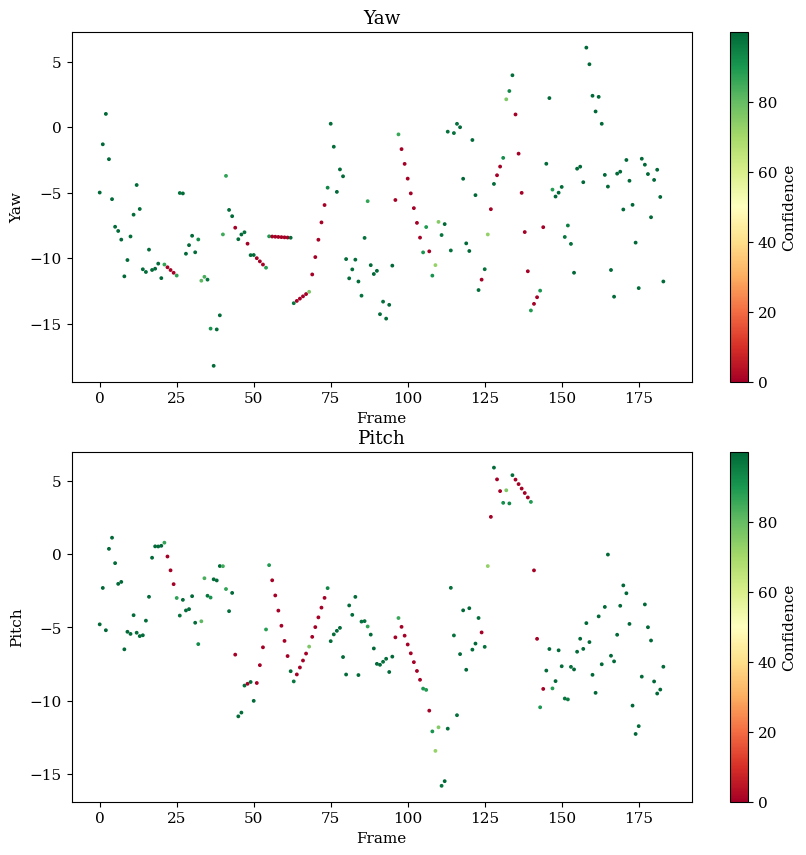

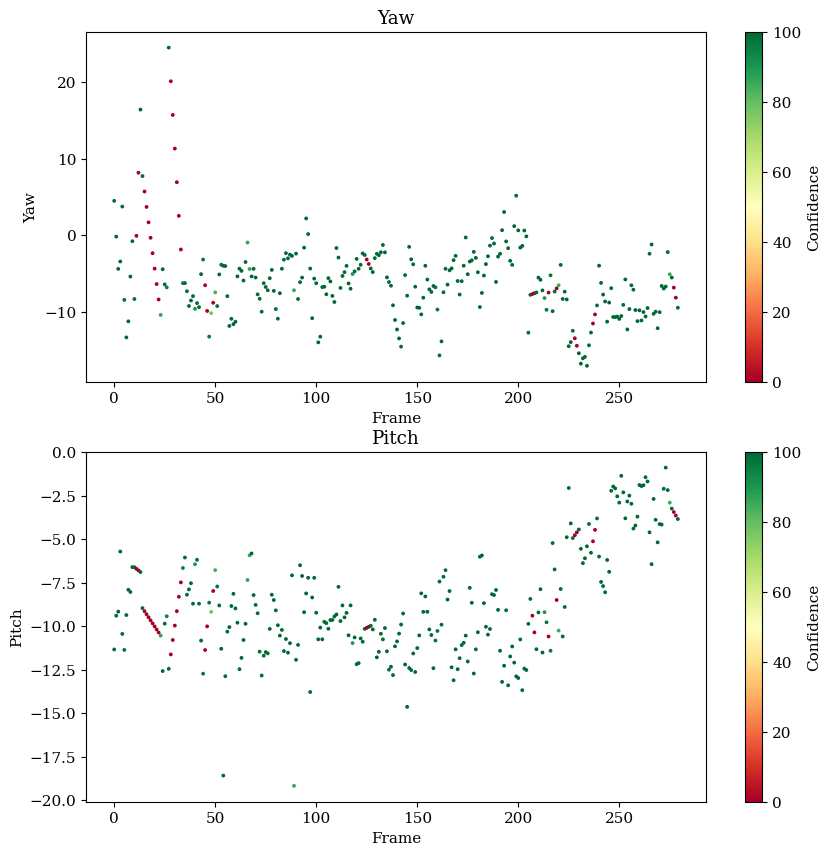

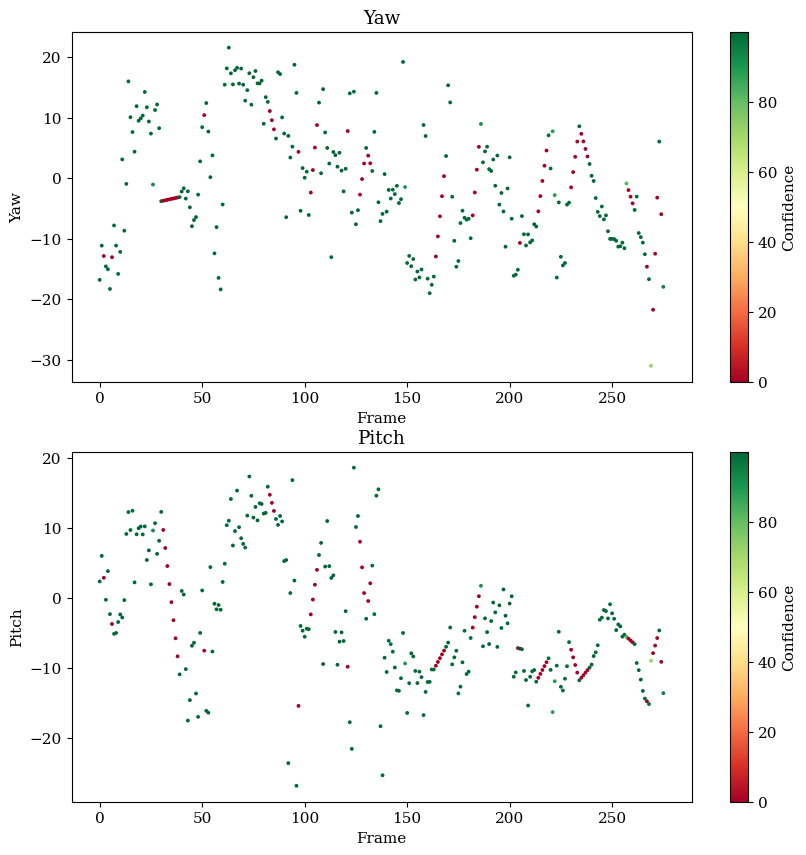

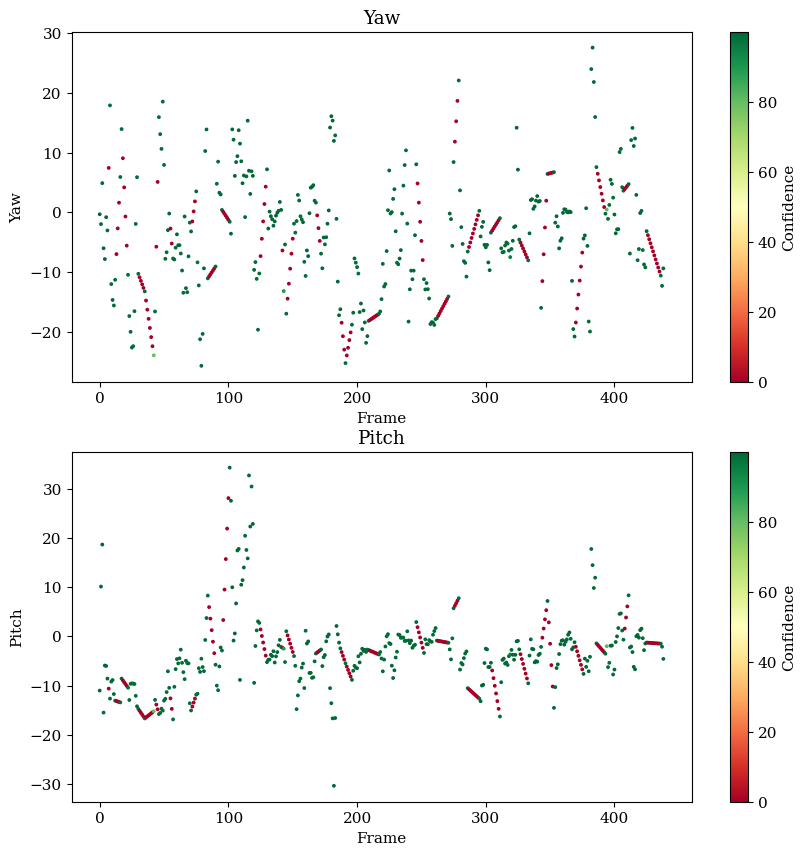

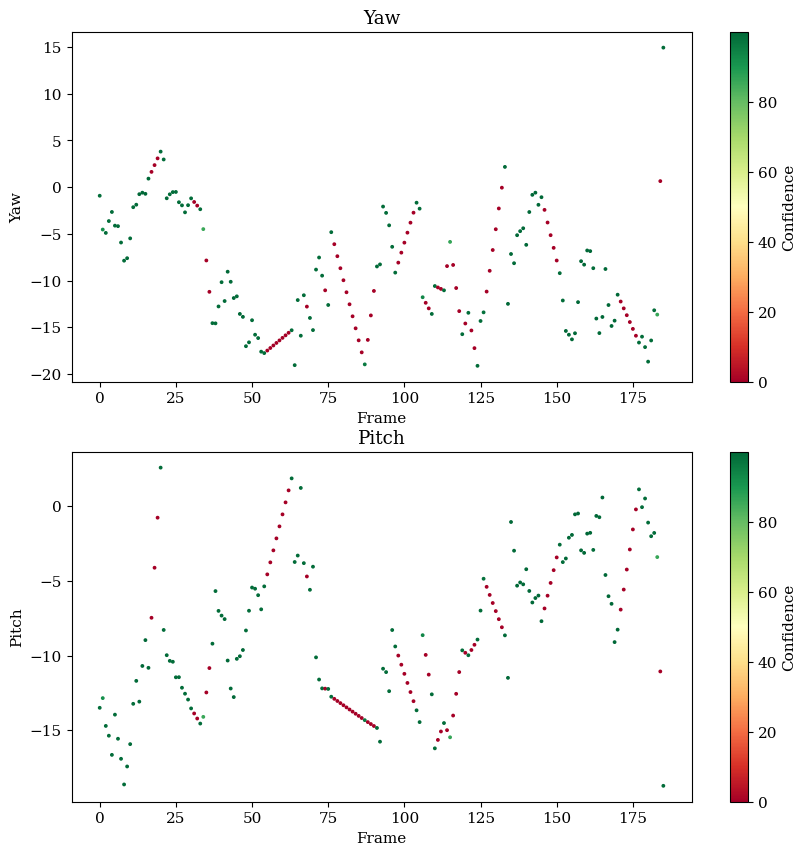

...

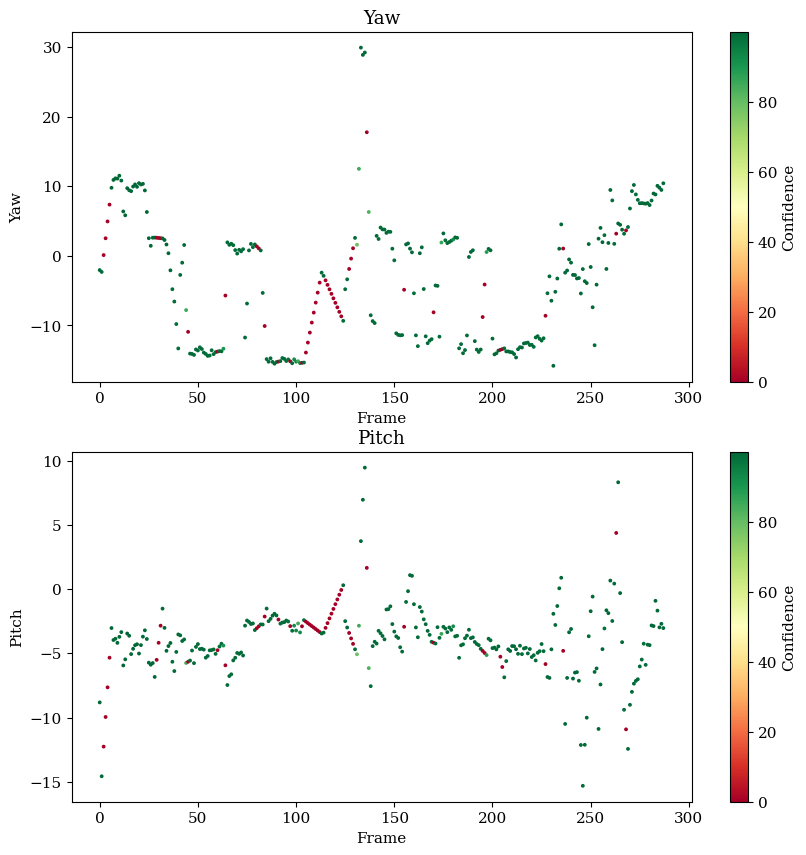

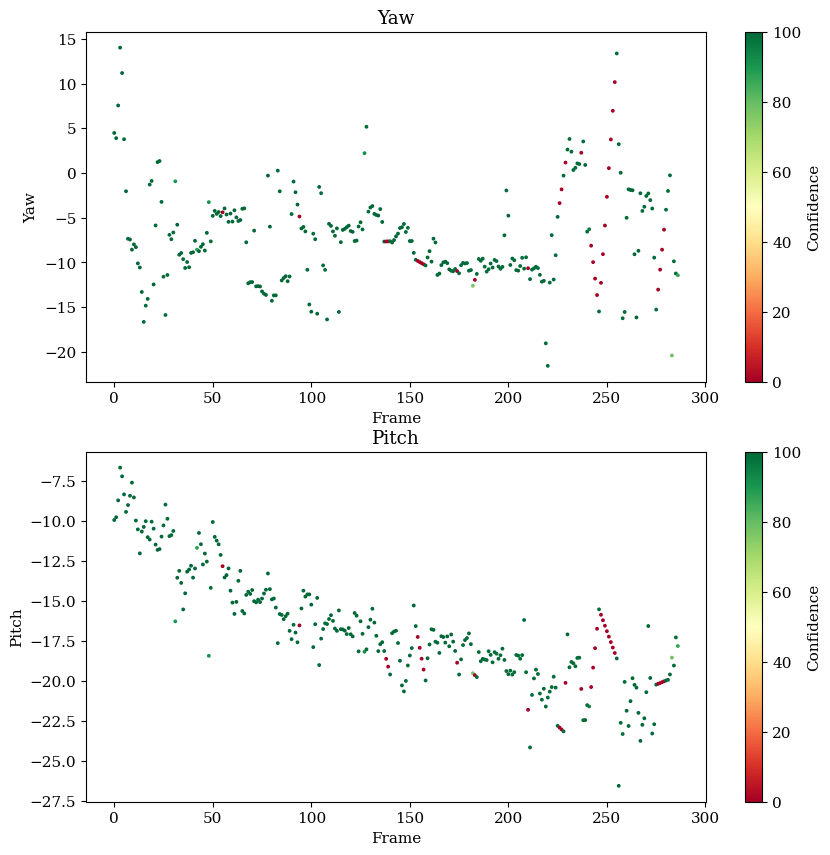

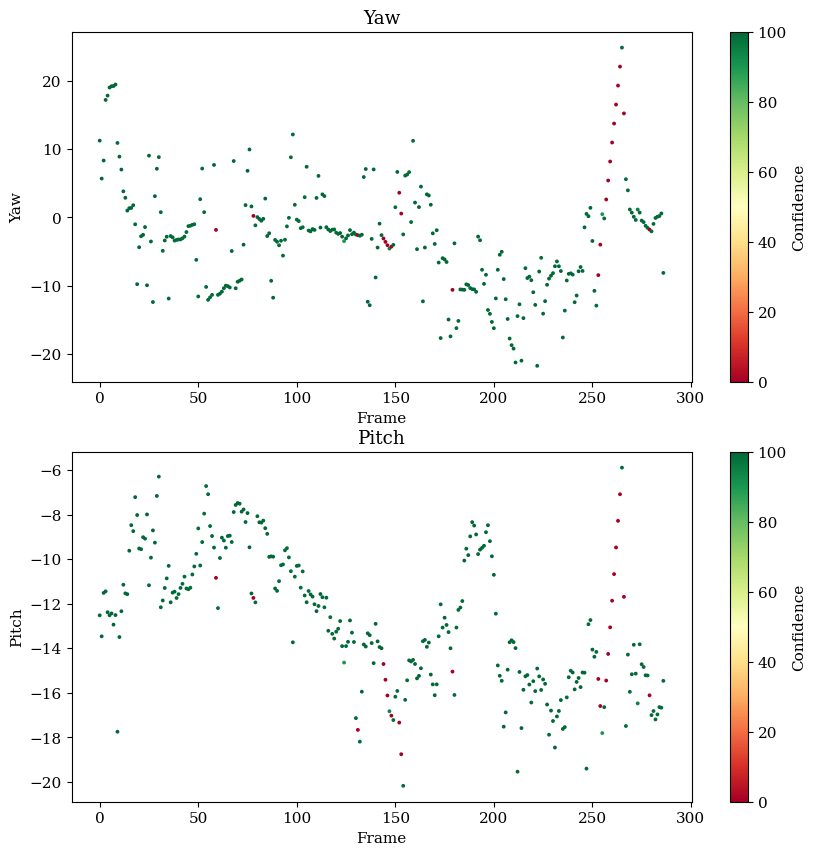

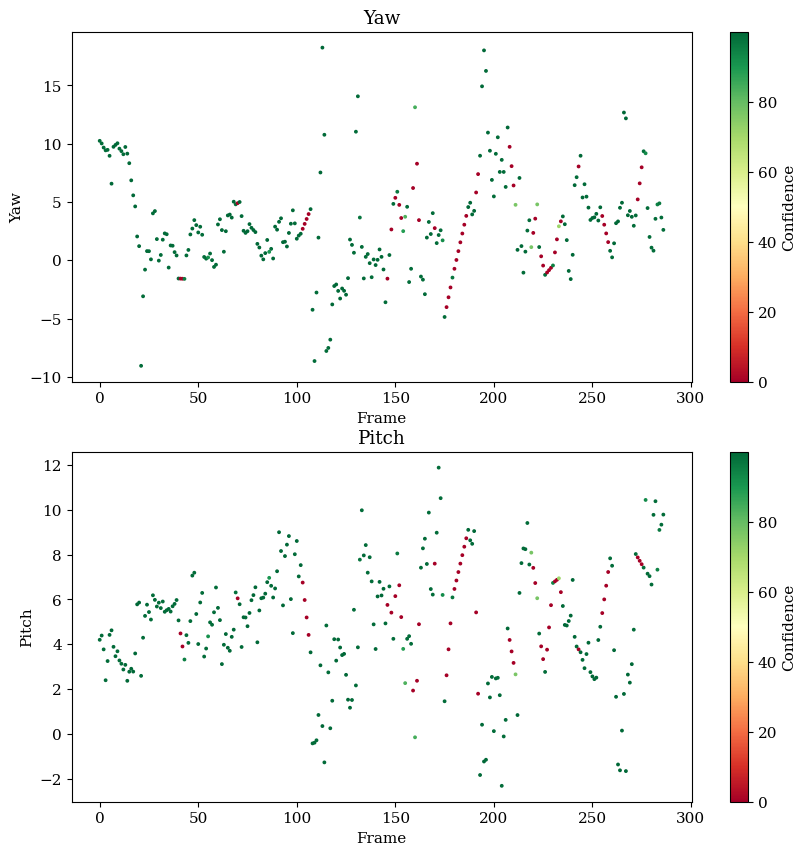

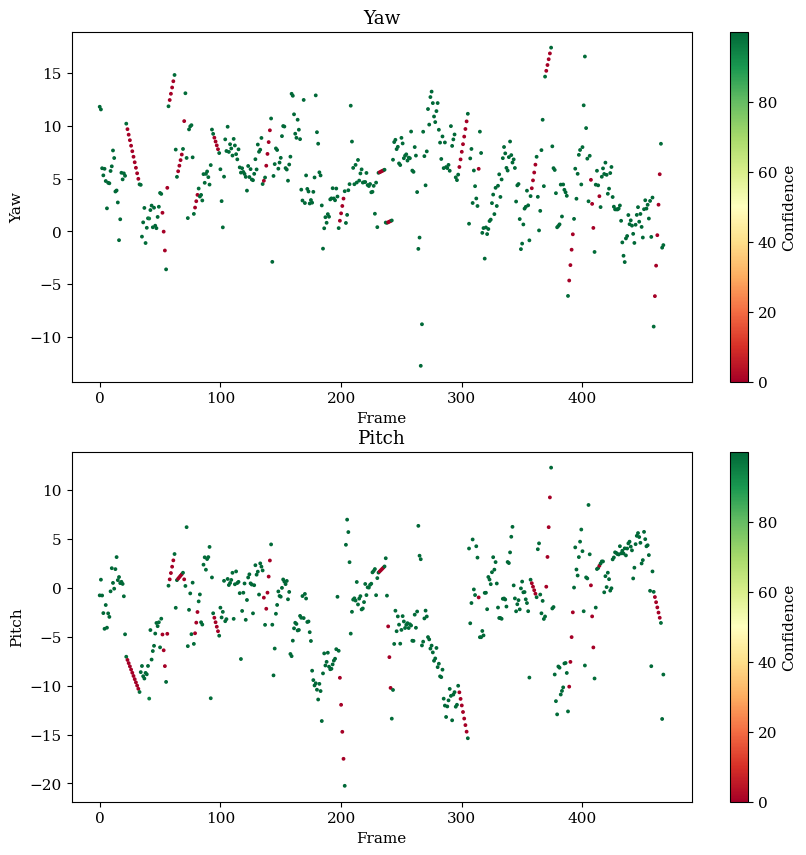

In [659]:
#We visualize the distribution of the number of frames with face for NT children
#We visualize the pitch and yaw statistics for NT children

for i in range(len(df_new_rows_NT)):  # Limiting to the first 5 rows for demonstration
    try:
        video_key = df_new_rows_NT.iloc[i]['video_key']
        plot_yaw_pitch(df_new_rows_NT.iloc[i]['eye_directions'], df_new_rows_NT.iloc[i]['confidences'])

    except KeyError as e:
        print(f"Error at index {i}: {e}")